In [1]:
import pandas as pd
import numpy as np
import logging
import tensorflow as tf
import warnings
import glob
import os

from tqdm import tqdm
from IPython import display
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

from skimage.io import imread, imshow
from skimage.transform import resize

from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Conv2D, Lambda, MaxPooling2D, Dense, Dropout, Flatten, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

what the data looks like

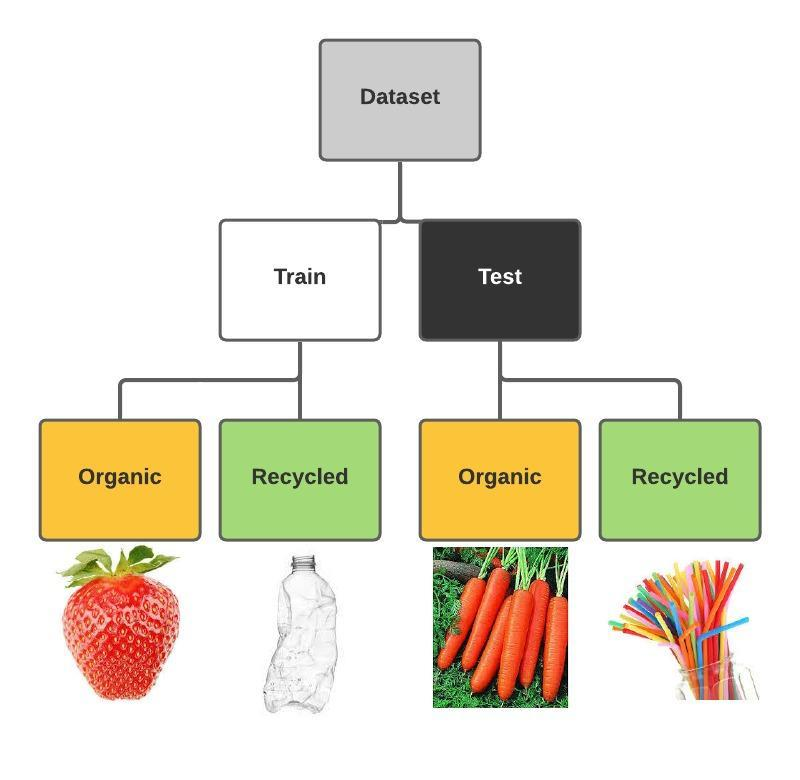

In [2]:
# Show the overall structure of the dataset
display.Image('/content/waste_data_structure.jpeg', width = 550, height = 250)

In [3]:
pip install gitpython


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.7 MB/s eta 0:00:00


cloning the data from github

In [4]:
import git
import os

# URL of the GitHub repository
repo_url = "https://github.com/manuelamc14/waste-classification-model.git"

# Directory where you want to clone the repository
target_directory = "waste-classification-model"

# Clone the repository
if not os.path.exists(target_directory):
    git.Repo.clone_from(repo_url, target_directory)
    print("Repository cloned successfully!")
else:
    print("Repository already exists!")

Repository cloned successfully!


In [5]:
import os

# Directory paths for importing data
base_dir = "waste-classification-model/Resources/Dataset"
train_dir = os.path.join(base_dir, "Train")
test_dir = os.path.join(base_dir, "Test")

# Print the directory paths to verify
print("Base directory:", base_dir)
print("Train directory:", train_dir)
print("Test directory:", test_dir)


Base directory: waste-classification-model/Resources/Dataset
Train directory: waste-classification-model/Resources/Dataset/Train
Test directory: waste-classification-model/Resources/Dataset/Test


no of training samples

In [6]:
import os
import glob

# Directory paths for importing data
base_dir = "waste-classification-model/Resources/Dataset"
train_dir = os.path.join(base_dir, "Train")

# Os path join (train)
train_o = glob.glob(os.path.join(train_dir, 'O', '*.jpg'))
train_r = glob.glob(os.path.join(train_dir, 'R', '*.jpg'))

# Count the number of files
a = len(train_o)
b = len(train_r)

# Print the total number of training samples
print("Number of training samples: {}".format(a + b))


Number of training samples: 22564


no of testing samples

In [7]:
import os
import glob

# Directory paths for importing data
base_dir = "waste-classification-model/Resources/Dataset"
test_dir = os.path.join(base_dir, "Test")

# Os path join (test)
test_o = glob.glob(os.path.join(test_dir, 'O', '*.jpg'))
test_r = glob.glob(os.path.join(test_dir, 'R', '*.jpg'))

# Count the number of files
a = len(test_o)
b = len(test_r)

# Print the total number of test samples
print("Number of test samples: {}".format(a + b))

Number of test samples: 2513


In [8]:
# Train data generator with data augmentation
train_datagen = ImageDataGenerator(rescale=1.0 / 255.0,
                                   zoom_range=0.2,  # Adjust the zoom range
                                   rotation_range=20,  # Adjust the rotation range
                                   width_shift_range=0.2,  # Adjust the width shift range
                                   height_shift_range=0.2,  # Adjust the height shift range
                                   shear_range=0.2,  # Adjust the shear range
                                   horizontal_flip=True,  # Enable horizontal flipping
                                   vertical_flip=True,  # Enable vertical flipping
                                   validation_split=0.2)

# Validation data generator
valid_datagen = ImageDataGenerator(rescale=1.0 / 255.0,
                                   validation_split=0.2)

# Test data generator
test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)

In [9]:
# Train dataset
train_ds = train_datagen.flow_from_directory(directory=train_dir,
                                             target_size=(180, 180),  # Adjust the target size of the images
                                             class_mode='categorical',  # Set class_mode to 'categorical'
                                             batch_size=32,
                                             subset='training')  # Use the 'training' subset

Found 18052 images belonging to 2 classes.


In [10]:
# Validate dataset

valid_ds = valid_datagen.flow_from_directory(directory = train_dir,
                                                  target_size = (180, 180),
                                                  class_mode = 'categorical',
                                                  batch_size = 32,
                                                  subset = 'validation')

Found 4512 images belonging to 2 classes.


In [11]:
# Test dataset

test_ds = test_datagen.flow_from_directory(directory = test_dir,
                                                  target_size = (180, 180),
                                                  class_mode = 'categorical',
                                                  batch_size = 32,
                                                  shuffle=False)

Found 2513 images belonging to 2 classes.


In [12]:
# Check classes

print(train_ds.class_indices)
print(test_ds.class_indices)

{'O': 0, 'R': 1}
{'O': 0, 'R': 1}


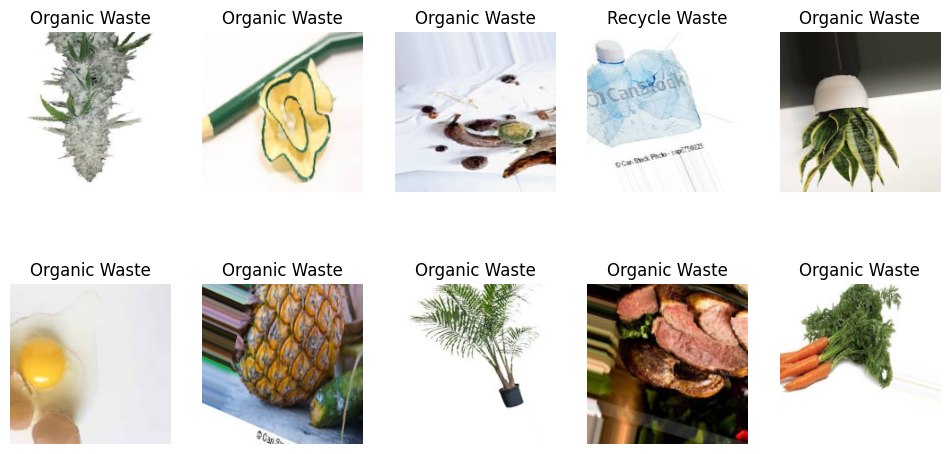

In [13]:
# Viewing images

fig, ax = plt.subplots(nrows = 2, ncols = 5, figsize = (12,6))
#plt.subplots_adjust(hspace=0.55)

for i in range(2):
    for j in range(5):
        rand1 = np.random.randint(len(train_ds))
        rand2 = np.random.randint(32)
        ax[i,j].imshow(train_ds[rand1][0][rand2])
        ax[i,j].axis('off')
        label = train_ds[rand1][1][rand2]
        # print(label[0])
        if label[0] == 0:
            ax[i,j].set_title('Recycle Waste')
        else:
            ax[i,j].set_title('Organic Waste')

plt.tight_layout
plt.show()

In [14]:
# Defining callbacks

filepath = './final_model_weights.hdf5'

earlystopping = EarlyStopping(monitor = 'val_auc',
                              mode = 'max' ,
                              patience = 5,
                              verbose = 1)

checkpoint = ModelCheckpoint(filepath,
                                monitor = 'val_auc',
                                mode='max',
                                save_best_only=True,
                                verbose = 1)


callback_list = [earlystopping, checkpoint]

Building a model

In [15]:
# Defining callbacks

filepath = './final_model_weights.hdf5'

earlystopping = EarlyStopping(monitor = 'val_auc',
                              mode = 'max' ,
                              patience = 5,
                              verbose = 1)

checkpoint = ModelCheckpoint(filepath,
                                monitor = 'val_auc',
                                mode='max',
                                save_best_only=True,
                                verbose = 1)


callback_list = [earlystopping, checkpoint]


Base model VGG16

In [16]:
from tensorflow.keras.applications import VGG16

# Base model
base_model = VGG16(input_shape=(180,180,3),
                   include_top=False,
                   weights="imagenet")


58889256/58889256 [==============================] - 0s 0us/step


In [17]:
# Freezing layers

for layer in base_model.layers:
    layer.trainable=False

In [18]:
# Show vgg model summary
base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 180, 180, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 180, 180, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 90, 90, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 90, 90, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 90, 90, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 45, 45, 128)       0     

Visualizing Base Model Layers With Test Images

block1_conv1
64


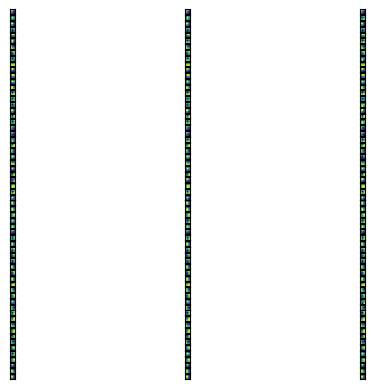

block1_conv2
64


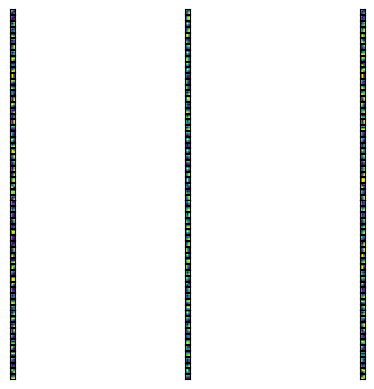

block2_conv1
128


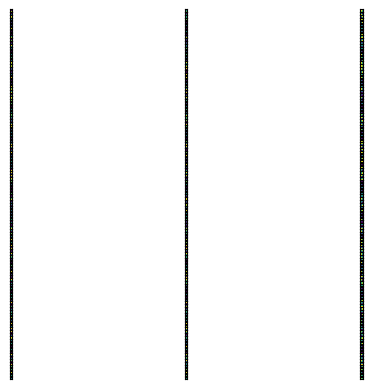

block2_conv2
128


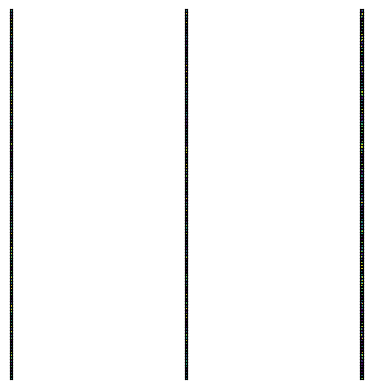

block3_conv1
256


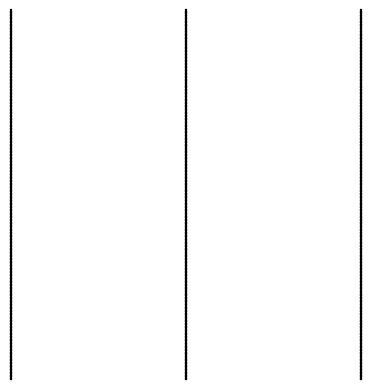

block3_conv2
256


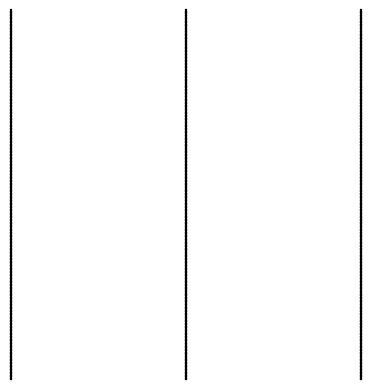

block3_conv3
256


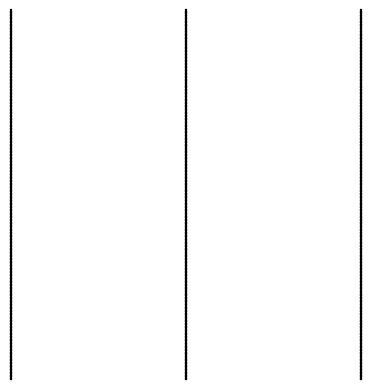

block4_conv1
512


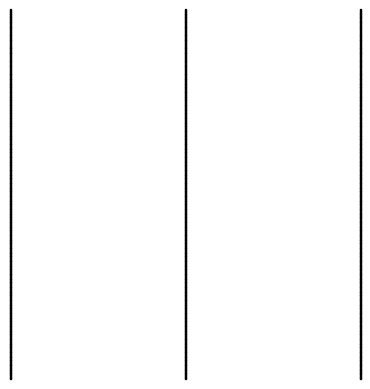

block4_conv2
512


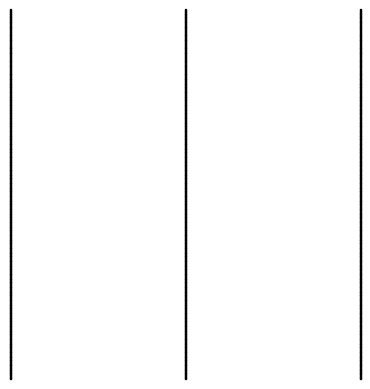

block4_conv3
512


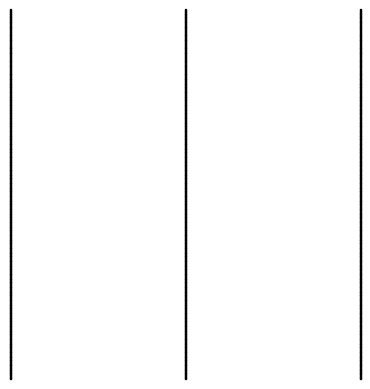

block5_conv1
512


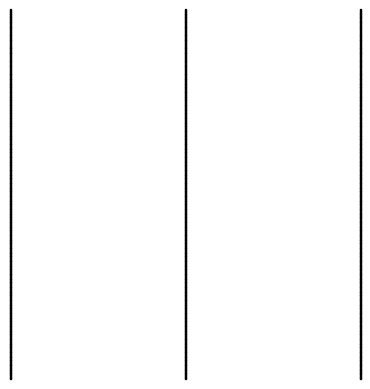

block5_conv2
512


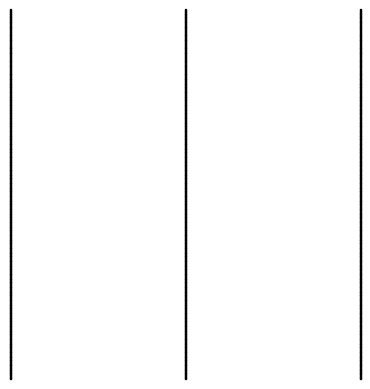

block5_conv3
512


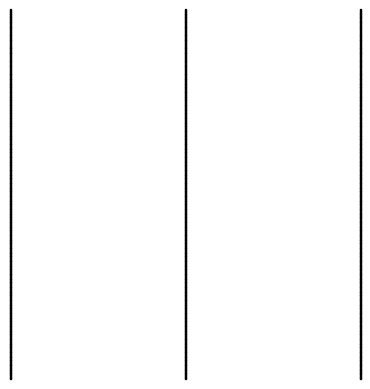

In [19]:
# Iterate thru all the layers of the model

for layer in base_model.layers:
    if 'conv' in layer.name:
        weights, bias= layer.get_weights()
        # filters, biases = layer.get_weights()
        print(layer.name)
        # print(layer.name, filters.shape)
        # normalize filter values between  0 and 1 for visualization
        f_min, f_max = weights.min(), weights.max()
        filters = (weights - f_min) / (f_max - f_min)
        print(filters.shape[3])
        filter_cnt=1
        # plotting all the filters
        for i in range(filters.shape[3]):
            # get the filters
            filt=filters[:,:,:, i]
            # plotting each of the channel, color image RGB channels
            for j in range(filters.shape[0]):
                ax = plt.subplot(filters.shape[3], filters.shape[0], filter_cnt)
                ax.set_xticks([])
                ax.set_yticks([])
                plt.imshow(filt[:,:, j])
                filter_cnt+=1
        plt.show()

1/1 [==============================] - 4s 4s/step
(1, 180, 180, 64)
(1, 180, 180, 64)


<ipython-input-20-12df207b80d8>:51: RuntimeWarning: invalid value encountered in divide
  x /= x.std()
<ipython-input-20-12df207b80d8>:54: RuntimeWarning: invalid value encountered in cast
  x = np.clip(x, 0, 255).astype('uint8')


(1, 90, 90, 64)
(1, 90, 90, 128)
(1, 90, 90, 128)
(1, 45, 45, 128)
(1, 45, 45, 256)
(1, 45, 45, 256)
(1, 45, 45, 256)
(1, 22, 22, 256)
(1, 22, 22, 512)
(1, 22, 22, 512)
(1, 22, 22, 512)
(1, 11, 11, 512)
(1, 11, 11, 512)
(1, 11, 11, 512)
(1, 11, 11, 512)
(1, 5, 5, 512)


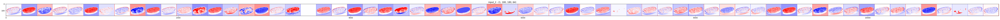

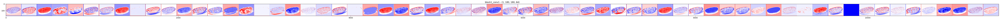

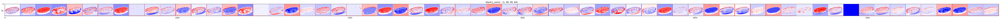

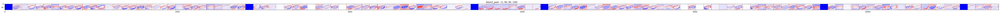

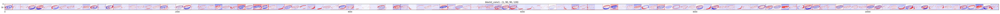

...

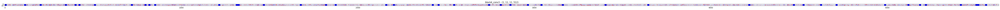

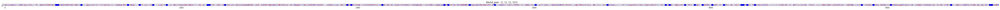

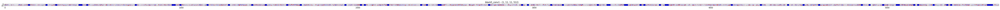

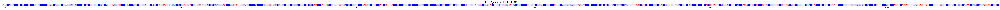

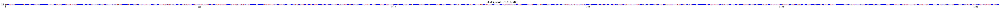

In [20]:
import logging
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications import VGG16
import tensorflow as tf
import warnings

# Disable TensorFlow warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)
logging.getLogger('tensorflow').disabled = True

# Image path
img_path = test_dir + '/O' + '/O_12825.jpg'

# Load pre-trained VGG16 model
base_model = VGG16(input_shape=(180, 180, 3), include_top=False, weights="imagenet")

# Define a new model to visualize intermediate representations
successive_outputs = [layer.output for layer in base_model.layers[1:]]
visualization_model = tf.keras.models.Model(inputs=base_model.input, outputs=successive_outputs)

# Load the input image
img = load_img(img_path, target_size=(180, 180))
x = img_to_array(img)
x = x.reshape((1,) + x.shape)
x /= 255.0  # Rescale by 1/255

# Obtain all intermediate representations for the image
successive_feature_maps = visualization_model.predict(x)

# Retrieve the names of the layers
layer_names = [layer.name for layer in base_model.layers]

# Visualize feature maps for convolutional and maxpool layers
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
    print(feature_map.shape)  # Print the shape of the feature map

    if len(feature_map.shape) == 4:
        n_features = feature_map.shape[-1]  # number of features in the feature map
        size = feature_map.shape[1]  # feature map shape (1, size, size, n_features)

        # Tile our images in a matrix
        display_grid = np.zeros((size, size * n_features))

        # Postprocess the feature to be visually palatable
        for i in range(n_features):
            x = feature_map[0, :, :, i]
            x -= x.mean()
            x /= x.std()
            x *= 64
            x += 128
            x = np.clip(x, 0, 255).astype('uint8')

            # Tile each filter into a horizontal grid
            display_grid[:, i * size: (i + 1) * size] = x

        # Display the grid
        scale = 20. / n_features
        plt.figure(figsize=(scale * n_features * 5, scale * 4))
        plt.title(f"{layer_name} - {feature_map.shape}")  # Include shape information in the plot title
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='bwr')

plt.show()



1/1 [==============================] - 0s 171ms/step
(1, 180, 180, 64)
(1, 180, 180, 64)
(1, 90, 90, 64)
(1, 90, 90, 128)
(1, 90, 90, 128)
(1, 45, 45, 128)
(1, 45, 45, 256)
(1, 45, 45, 256)
(1, 45, 45, 256)
(1, 22, 22, 256)
(1, 22, 22, 512)
(1, 22, 22, 512)
(1, 22, 22, 512)
(1, 11, 11, 512)
(1, 11, 11, 512)
(1, 11, 11, 512)
(1, 11, 11, 512)
(1, 5, 5, 512)


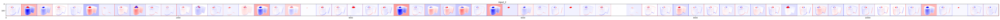

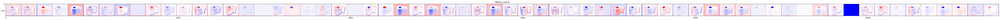

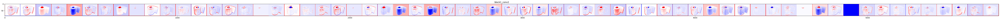

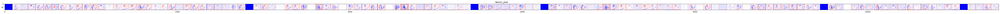

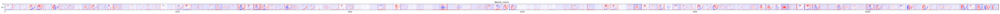

...

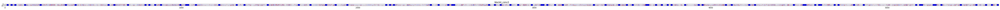

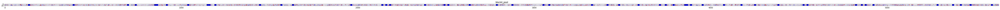

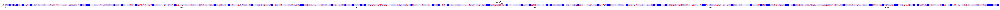

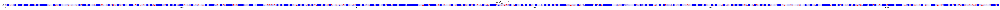

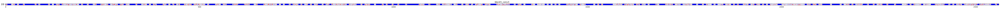

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import tensorflow as tf
import warnings

# Suppress runtime warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

# Image path
img_path = test_dir + '/R' + '/R_11107.jpg'

# Define a new model, input=image
# Output=intermediate representations for all layers in the previous model after the first
successive_outputs = [layer.output for layer in base_model.layers[1:]]

# Visualization_model = Model(img_input, successive_outputs)
visualization_model = tf.keras.models.Model(inputs=base_model.input, outputs=successive_outputs)

# Load the input image
img = load_img(img_path, target_size=(180, 180))

# Convert the image to an array of dimension (180, 180, 3)
x = img_to_array(img)
x = x.reshape((1,) + x.shape)

# Rescale by 1/255
x /= 255.0

# Run input image through our visualization network to obtain all intermediate representations for the image
successive_feature_maps = visualization_model.predict(x)

# Retrieve the names of the layers, so we can have them as part of our plot
layer_names = [layer.name for layer in base_model.layers]
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
    print(feature_map.shape)
    if len(feature_map.shape) == 4:
        # Plot Feature maps for the conv / maxpool layers, not the fully-connected layers
        n_features = feature_map.shape[-1]  # number of features in the feature map
        size = feature_map.shape[1]  # feature map shape (1, size, size, n_features)

        # We will tile our images in this matrix
        display_grid = np.zeros((size, size * n_features))

        # Postprocess the feature to be visually palatable
        for i in range(n_features):
            x = feature_map[0, :, :, i]
            x -= x.mean()
            x /= x.std()
            x *= 64
            x += 128
            x = np.clip(x, 0, 255).astype('uint8')

            # Tile each filter into a horizontal grid
            display_grid[:, i * size: (i + 1) * size] = x

        # Display the grid
        scale = 20. / n_features
        plt.figure(figsize=(scale * n_features * 5, scale * 4))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='bwr')

plt.show()


Adding to the Base Model - Building Dense Layers

In [22]:
# Defining Layers
model=Sequential()
model.add(base_model)
model.add(Dropout(0.2))
model.add(Flatten())

# Add dense layers
model.add(BatchNormalization())
model.add(Dense(5000,activation="relu",kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(1000,activation="relu",kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(500,activation="relu",kernel_initializer='he_uniform'))
model.add(Dropout(0.2))
model.add(Dense(2,activation="softmax"))

In [23]:
# Show model summary (with custom layers)

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 5, 5, 512)         14714688  
                                                                 
 dropout (Dropout)           (None, 5, 5, 512)         0         
                                                                 
 flatten (Flatten)           (None, 12800)             0         
                                                                 
 batch_normalization (Batch  (None, 12800)             51200     
 Normalization)                                                  
                                                                 
 dense (Dense)               (None, 5000)              64005000  
                                                                 
 batch_normalization_1 (Bat  (None, 5000)              20000     
 chNormalization)                                       

Model Training

First Model

In [24]:
# Model fit (training)

model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=[tf.keras.metrics.AUC(name = 'auc')])
model_history = model.fit(train_ds, epochs=20, validation_data=valid_ds, callbacks = callback_list, verbose = 1)

Epoch 1/20
565/565 [==============================] - ETA: 0s - loss: 0.6501 - auc: 0.8197
Epoch 1: val_auc improved from -inf to 0.72409, saving model to ./final_model_weights.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


565/565 [==============================] - 282s 458ms/step - loss: 0.6501 - auc: 0.8197 - val_loss: 4.4441 - val_auc: 0.7241
Epoch 2/20
565/565 [==============================] - ETA: 0s - loss: 0.4578 - auc: 0.8734
Epoch 2: val_auc improved from 0.72409 to 0.83904, saving model to ./final_model_weights.hdf5
565/565 [==============================] - 261s 461ms/step - loss: 0.4578 - auc: 0.8734 - val_loss: 0.5239 - val_auc: 0.8390
Epoch 3/20
565/565 [==============================] - ETA: 0s - loss: 0.4161 - auc: 0.8952
Epoch 3: val_auc improved from 0.83904 to 0.84792, saving model to ./final_model_weights.hdf5
565/565 [==============================] - 255s 450ms/step - loss: 0.4161 - auc: 0.8952 - val_loss: 0.8501 - val_auc: 0.8479
Epoch 4/20
565/565 [==============================] - ETA: 0s - loss: 0.4029 - auc: 0.9019
Epoch 4: val_auc did not improve from 0.84792
565/565 [==============================] - 245s 433ms/step - loss: 0.4029 - auc: 0.9019 - val_loss: 2.3704 - val_auc: 

In [25]:
# Storing loss and accuracy values into a DataFrame to save permanently for plots

# Store model.fit results in a variable
history = model_history

# Save as DataFrame:
history_df = pd.DataFrame(history.history)
history_df

,loss,auc,val_loss,val_auc
0,0.650102,0.819705,4.444052,0.724087
1,0.457842,0.873381,0.523881,0.839042
2,0.416098,0.895159,0.850063,0.847924
3,0.402935,0.901924,2.370439,0.580725
4,0.399755,0.903869,1.276759,0.756253
5,0.399442,0.904598,0.435980,0.905909
6,0.390261,0.908086,7.682917,0.898344
7,0.392715,0.907695,34.531818,0.875267
8,0.385778,0.910572,6.259701,0.915376
9,0.377399,0.913898,14.675303,0.794241


In [26]:
import os

# Define the directory path
directory = 'Resources/Model'

# Create the directory if it doesn't exist
if not os.path.exists(directory):
    os.makedirs(directory)

# Save as csv
history_df.to_csv(os.path.join(directory, 'model_history.csv'), index=False)


In [27]:
# Import csv
model_history = pd.read_csv ('Resources/Model/model_history.csv')
model_history

,loss,auc,val_loss,val_auc
0,0.650102,0.819705,4.444052,0.724087
1,0.457842,0.873381,0.523881,0.839042
2,0.416098,0.895159,0.850063,0.847924
3,0.402935,0.901924,2.370439,0.580725
4,0.399755,0.903869,1.276759,0.756253
5,0.399442,0.904598,0.435980,0.905909
6,0.390261,0.908086,7.682917,0.898344
7,0.392715,0.907695,34.531818,0.875267
8,0.385778,0.910572,6.259701,0.915376
9,0.377399,0.913898,14.675303,0.794241


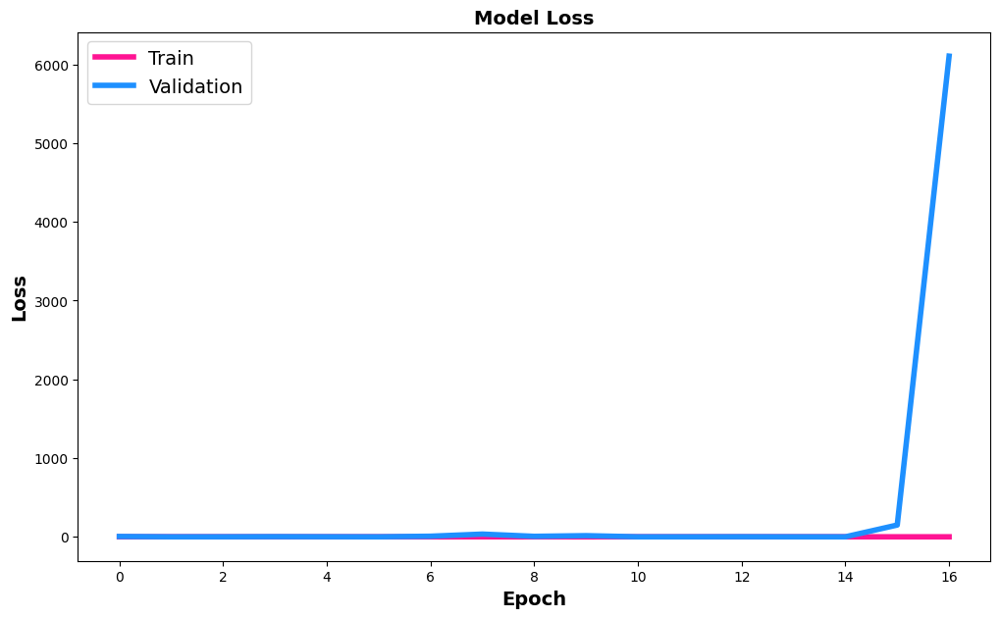

In [28]:
plt.figure(figsize=(12, 7))
plt.plot(model_history['loss'], color='deeppink', linewidth=4)
plt.plot(model_history['val_loss'], color='dodgerblue', linewidth=4)
plt.title('Model Loss', fontsize=14, fontweight='bold')
plt.ylabel('Loss', fontsize=14, fontweight='bold')
plt.xlabel('Epoch', fontsize=14, fontweight='bold')
plt.legend(['Train', 'Validation'], loc='upper left', fontsize=14)
plt.show()

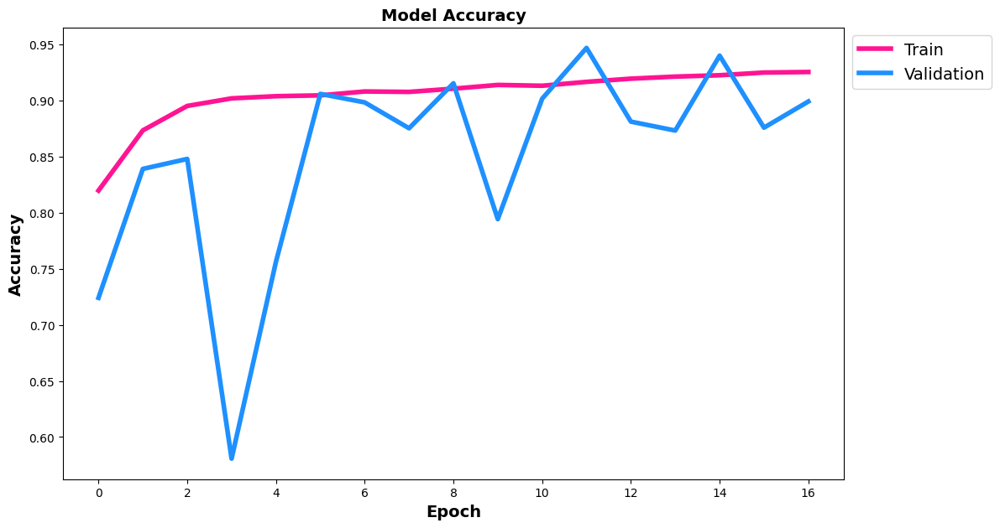

In [29]:
# Plot the model accuracy

plt.figure(figsize=(12,7))
plt.plot(model_history['auc'], color='deeppink', linewidth=4)
plt.plot(model_history['val_auc'], color='dodgerblue', linewidth=4)
plt.title('Model Accuracy', fontsize=14, fontweight='bold')
plt.ylabel('Accuracy', fontsize=14, fontweight='bold')
plt.xlabel('Epoch', fontsize=14, fontweight='bold')
plt.legend(['Train', 'Validation'], loc='upper left', bbox_to_anchor=(1,1), fontsize=14)
plt.show()

Model Evaluation

In [30]:
# Evaluate overall loss and accuracy for test data
model.evaluate(test_ds)

79/79 [==============================] - 10s 126ms/step - loss: 1646.5239 - auc: 0.9132


[1646.52392578125, 0.9131963849067688]

In [31]:
# Store final values as variables

loss_final = 0.3659922480583191
auc_final = 0.9392455220222473
print(f"The final loss was {loss_final}, and the final accuracy was {auc_final}.")

The final loss was 0.3659922480583191, and the final accuracy was 0.9392455220222473.


In [32]:
# Evaluate model on the test dataset
test_loss, test_accuracy = model.evaluate(test_ds, verbose=1)

print(f'Test accuracy: {test_accuracy}')


79/79 [==============================] - 8s 101ms/step - loss: 1646.5239 - auc: 0.9132
Test accuracy: 0.9131963849067688


Classification Report

In [33]:
# Confusion Matrix and Classification Report

metrics=tf.keras.metrics.AUC(name = 'auc')

num_of_test_samples = 2513
batch_size = 32

Y_pred = model.predict(test_ds, num_of_test_samples // batch_size+1)
y_pred = np.argmax(Y_pred, axis=1)
print('Confusion Matrix')
print(confusion_matrix(test_ds.classes, y_pred))
print('Classification Report')
target_names = ['Organic', 'Recycled']
print(classification_report(test_ds.classes, y_pred, target_names=target_names))

79/79 [==============================] - 7s 87ms/step
Confusion Matrix
[[1237  164]
 [ 155  957]]
Classification Report
              precision    recall  f1-score   support

     Organic       0.89      0.88      0.89      1401
    Recycled       0.85      0.86      0.86      1112

    accuracy                           0.87      2513
   macro avg       0.87      0.87      0.87      2513
weighted avg       0.87      0.87      0.87      2513



Text(0.5, 1.0, 'Classification Report')

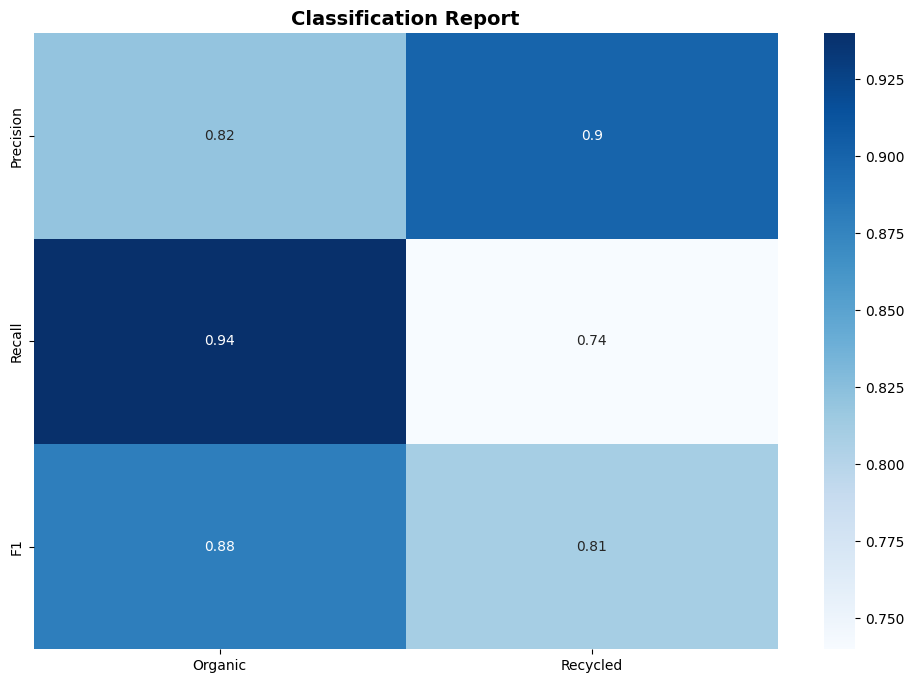

In [34]:
# Plot the classification report

# Put data into a 2D array
data = np.array([[.82, .90],
                 [.94, .74],
                [.88, .81]])

# Plot the heatmap
yticklabels = ['Precision', 'Recall', 'F1']
xticklabels = ['Organic', 'Recycled']
fig, ax = plt.subplots(figsize=(12,8))
ax = sns.heatmap(data, xticklabels=xticklabels, yticklabels=yticklabels, annot=True, cmap='Blues')
ax.set_title("Classification Report", fontsize=14, fontweight='bold')

In [35]:
# Removing scientific notation in the heatmap

np.set_printoptions(suppress=True, threshold=2000)

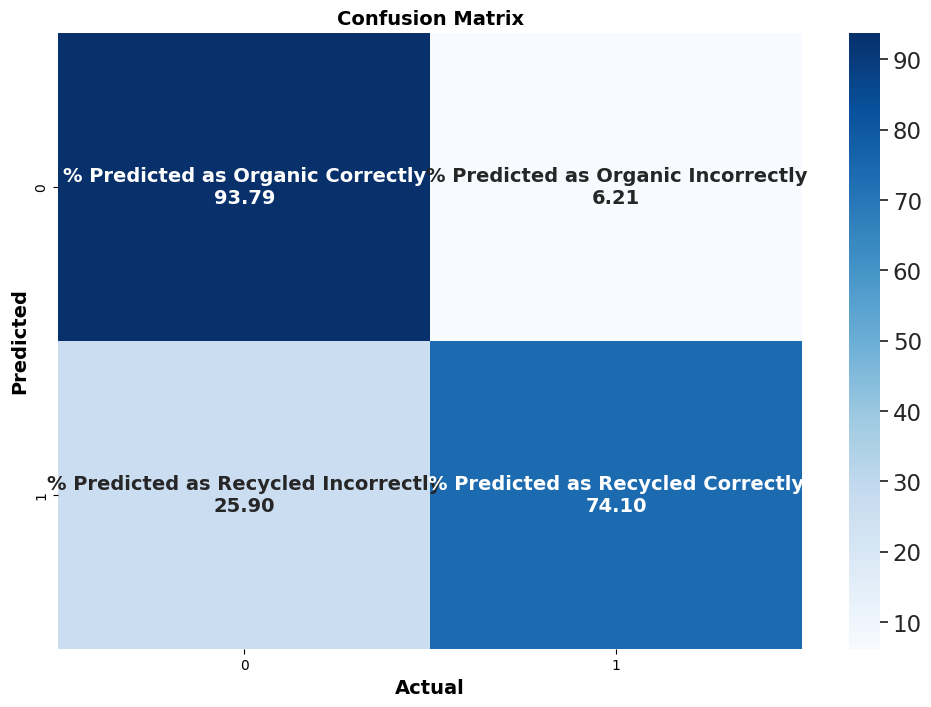

In [36]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Converting integers to percents
perc1 = round(1314/1401*100,2)
perc2 = round(87/1401*100,2)
perc3 = round(288/1112*100,2)
perc4 = round(824/1112*100,2)

# Put data into a 2D array
data = np.array([[perc1, perc2],
                [perc3, perc4]])

# Define the text labels for the heatmap cells
text_labels = np.array([['% Predicted as Organic Correctly', '% Predicted as Organic Incorrectly'],
                        ['% Predicted as Recycled Incorrectly', '% Predicted as Recycled Correctly']])

# Combine text labels with values
formatted_text = (np.asarray(["{0}\n{1:.2f}".format(text, data) for text, data in zip(text_labels.flatten(), data.flatten())])).reshape(2, 2)

# Plot heatmap
fig, ax = plt.subplots(figsize=(12,8))
sns.set(font_scale=1.5)
ax = sns.heatmap(data, annot=formatted_text, fmt="", cmap='Blues', annot_kws={"fontsize":14, "weight":'bold'})
ax.set_title("Confusion Matrix", fontsize=14, fontweight='bold')
ax.set_xlabel("Actual", fontsize=14, fontweight='bold')
ax.set_ylabel("Predicted", fontsize=14, fontweight='bold')

plt.show()


Predicting Test Images

In [37]:
# Load the saved model weights

model = load_model('/content/final_model_weights.hdf5')

In [38]:
def getprediction(img):
    img = img_to_array(img)
    img = img / 255
    imshow(img)
    plt.axis('off')
    img = np.expand_dims(img,axis=0)
    category = model.predict_classes(img)
    answer = category[0]
    probability = model.predict_proba(img)
    # probability_results = probability[0][0]
    if answer == 1:
        print(f"The image belongs to Recycle waste category, probability: {probability[0][1]}.")
    else:
        print(f"The image belongs to Organic waste category, probability: {probability[0][0]}.")

In [39]:
def get_prediction(img):
    # Display the image
    plt.imshow(img)
    plt.axis('off')

    # Expand the dimensions of the image array
    img = np.expand_dims(img, axis=0)

    # Get the probability scores for each class
    probabilities = model.predict(img)

    # Determine the predicted class based on the highest probability
    predicted_class = np.argmax(probabilities, axis=1)[0]

    # Display the predicted class and probability
    print("Predicted class:", predicted_class)
    print("Probability:", probabilities[0][predicted_class])


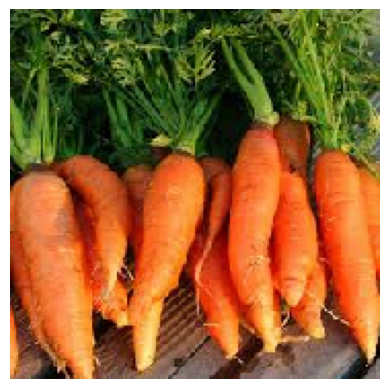

1/1 [==============================] - 0s 301ms/step
Predicted class: 0
Probability: 0.97777885
The image belongs to organic waste category.


In [42]:
from tensorflow import keras
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np

def get_prediction(model, img_path):
    # Load the image
    img = load_img(img_path, target_size=(180, 180))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

    # Convert image to array and normalize
    img_array = img_to_array(img) / 255.0

    # Expand dimensions to match model input shape
    img_array = np.expand_dims(img_array, axis=0)

    # Get the prediction
    prediction = model.predict(img_array)

    # Print the predicted class and probability
    predicted_class = np.argmax(prediction)
    print("Predicted class:", predicted_class)
    print("Probability:", prediction[0][predicted_class])

    # Provide meaningful message based on predicted class
    if predicted_class == 0:
        print("The image belongs to organic waste category.")
    else:
        print("The image belongs to Recycle waste category.")

# Load the model
model_path = '/content/final_model_weights.hdf5'  # Update with your model path
model = keras.models.load_model(model_path)

# Path to the image
img_path = '/content/O_12568 (2).jpg'

# Get the prediction
get_prediction(model, img_path)


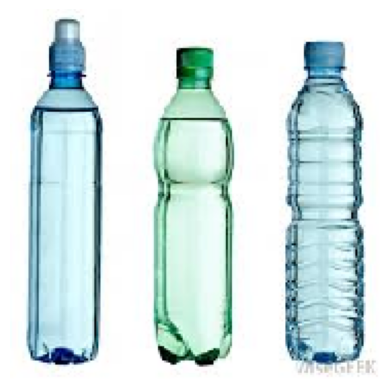

1/1 [==============================] - 0s 194ms/step
Predicted class: 1
Probability: 0.97414434
The image belongs to Recycle waste category.


In [44]:
from tensorflow import keras
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np

def get_prediction(model, img_path):
    # Load the image
    img = load_img(img_path, target_size=(180, 180))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

    # Convert image to array and normalize
    img_array = img_to_array(img) / 255.0

    # Expand dimensions to match model input shape
    img_array = np.expand_dims(img_array, axis=0)

    # Get the prediction
    prediction = model.predict(img_array)

    # Print the predicted class and probability
    predicted_class = np.argmax(prediction)
    print("Predicted class:", predicted_class)
    print("Probability:", prediction[0][predicted_class])

    # Provide meaningful message based on predicted class
    if predicted_class == 0:
        print("The image belongs to organic waste category.")
    else:
        print("The image belongs to Recycle waste category.")

# Load the model
model_path = '/content/final_model_weights.hdf5'  # Update with your model path
model = keras.models.load_model(model_path)

# Path to the image
img_path = '/content/R_1005 (1).jpg'  # Update with the full path to your image file

# Get the prediction
get_prediction(model, img_path)




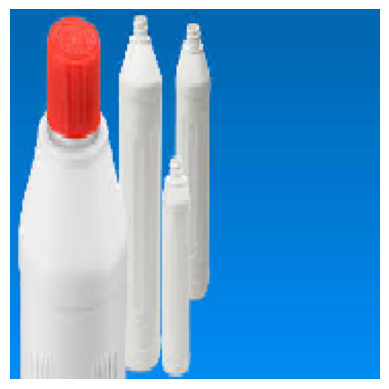

1/1 [==============================] - 0s 186ms/step
Predicted class: 1
Probability: 0.97811663
The image belongs to Recycle waste category.


In [46]:
from tensorflow import keras
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np

def get_prediction(model, img_path):
    # Load the image
    img = load_img(img_path, target_size=(180, 180))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

    # Convert image to array and normalize
    img_array = img_to_array(img) / 255.0

    # Expand dimensions to match model input shape
    img_array = np.expand_dims(img_array, axis=0)

    # Get the prediction
    prediction = model.predict(img_array)

    # Print the predicted class and probability
    predicted_class = np.argmax(prediction)
    print("Predicted class:", predicted_class)
    print("Probability:", prediction[0][predicted_class])

    # Provide meaningful message based on predicted class
    if predicted_class == 0:
        print("The image belongs to organic waste category.")
    else:
        print("The image belongs to Recycle waste category.")

# Load the model
model_path = '/content/final_model_weights.hdf5'  # Update with your model path
model = keras.models.load_model(model_path)

# Path to the image
img_path = '/content/R_1111.jpg'  # Update with the full path to your image file

# Get the prediction
get_prediction(model, img_path)



In [50]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Activation
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define the input shape
input_shape = (180, 180, 3)

# Create a Sequential model
model2 = Sequential()

# Convolutional layers with ReLU activation and MaxPooling
model2.add(Conv2D(32, (3, 3), input_shape=input_shape))
model2.add(Activation("relu"))
model2.add(MaxPooling2D())

model2.add(Conv2D(64, (3, 3)))
model2.add(Activation("relu"))
model2.add(MaxPooling2D())

model2.add(Conv2D(128, (3, 3)))
model2.add(Activation("relu"))
model2.add(MaxPooling2D())

# Flatten the output
model2.add(Flatten())

# Fully connected layers with Dropout
model2.add(Dense(256))
model2.add(Activation("relu"))
model2.add(Dropout(0.5))

model2.add(Dense(64))
model2.add(Activation("relu"))
model2.add(Dropout(0.5))

# Output layer
model2.add(Dense(1))  # Binary classification, so one output neuron
model2.add(Activation("sigmoid"))

# Compile the model
model2.compile(loss="binary_crossentropy",
              optimizer="adam",
              metrics=["accuracy"])

# Data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

test_datagen = ImageDataGenerator(rescale=1./255)

# Define train and test directories
train_path = '/content/waste-classification-model/Resources/Dataset/Train'
test_path = '/content/waste-classification-model/Resources/Dataset/Test'

# Define train and test generators
batch_size = 256
train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=(180, 180),
    batch_size=batch_size,
    class_mode='binary'
)

test_generator = test_datagen.flow_from_directory(
    test_path,
    target_size=(180, 180),
    batch_size=batch_size,
    class_mode='binary'
)

# Train the model
history = model2.fit_generator(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    epochs=20,  # Increased number of epochs
    validation_data=test_generator,
    validation_steps=test_generator.samples // batch_size
)


Found 22564 images belonging to 2 classes.
Found 2513 images belonging to 2 classes.


<ipython-input-50-6dc3998a78d3>:80: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model2.fit_generator(


Epoch 1/20
88/88 [==============================] - 208s 2s/step - loss: 0.5265 - accuracy: 0.7678 - val_loss: 0.4305 - val_accuracy: 0.8177
Epoch 2/20
88/88 [==============================] - 201s 2s/step - loss: 0.4350 - accuracy: 0.8163 - val_loss: 0.3815 - val_accuracy: 0.8481
Epoch 3/20
88/88 [==============================] - 201s 2s/step - loss: 0.4167 - accuracy: 0.8254 - val_loss: 0.3637 - val_accuracy: 0.8563
Epoch 4/20
88/88 [==============================] - 202s 2s/step - loss: 0.3922 - accuracy: 0.8366 - val_loss: 0.3344 - val_accuracy: 0.8681
Epoch 5/20
88/88 [==============================] - 199s 2s/step - loss: 0.3793 - accuracy: 0.8427 - val_loss: 0.3410 - val_accuracy: 0.8711
Epoch 6/20
88/88 [==============================] - 205s 2s/step - loss: 0.3658 - accuracy: 0.8487 - val_loss: 0.3423 - val_accuracy: 0.8737
Epoch 7/20
88/88 [==============================] - 204s 2s/step - loss: 0.3655 - accuracy: 0.8513 - val_loss: 0.3343 - val_accuracy: 0.8672
Epoch 8/20
88

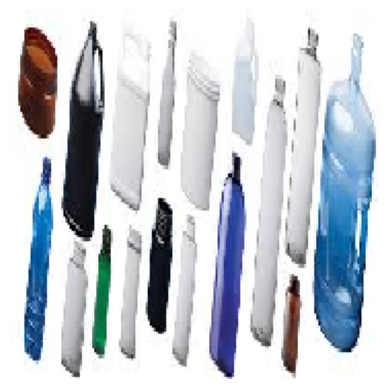

1/1 [==============================] - 0s 189ms/step
Predicted class: 1
Probability: 0.9802201
The image belongs to Recycle waste category.


In [48]:
from tensorflow import keras
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np

def get_prediction(model, img_path):
    # Load the image
    img = load_img(img_path, target_size=(180, 180))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

    # Convert image to array and normalize
    img_array = img_to_array(img) / 255.0

    # Expand dimensions to match model input shape
    img_array = np.expand_dims(img_array, axis=0)

    # Get the prediction
    prediction = model.predict(img_array)

    # Print the predicted class and probability
    predicted_class = np.argmax(prediction)
    print("Predicted class:", predicted_class)
    print("Probability:", prediction[0][predicted_class])

    # Provide meaningful message based on predicted class
    if predicted_class == 0:
        print("The image belongs to organic waste category.")
    else:
        print("The image belongs to Recycle waste category.")

# Load the model
model_path = '/content/final_model_weights.hdf5'  # Update with your model path
model = keras.models.load_model(model_path)

# Path to the image
img_path = '/content/R_1015 (1).jpg'  # Update with the full path to your image file

# Get the prediction
get_prediction(model, img_path)


Model 2

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Activation

model2 = Sequential()

model2.add(Conv2D(32, (3, 3), input_shape=(180, 180, 3)))
model2.add(Activation("relu"))
model2.add(MaxPooling2D())

model2.add(Conv2D(64, (3, 3)))
model2.add(Activation("relu"))
model2.add(MaxPooling2D())

model2.add(Conv2D(128, (3, 3)))
model2.add(Activation("relu"))
model2.add(MaxPooling2D())

model2.add(Flatten())

model2.add(Dense(256))
model2.add(Activation("relu"))
model2.add(Dropout(0.5))

model2.add(Dense(64))
model2.add(Activation("relu"))
model2.add(Dropout(0.5))

# Replace `numberOfClass` with the actual number of classes
numberOfClass = 2  # For example, if you have 2 classes
model2.add(Dense(numberOfClass))  # Output layer
model2.add(Activation("sigmoid"))

model2.compile(loss="binary_crossentropy",
               optimizer="adam",
               metrics=["accuracy"])

batch_size = 256


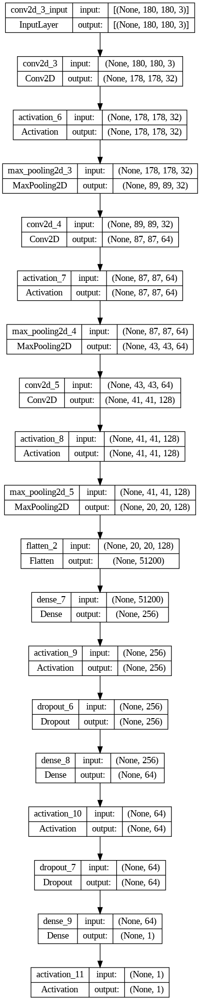

In [51]:
from tensorflow.keras.utils import plot_model

# Plot the architecture of model2
plot_model(model2, to_file='model2_plot.png', show_shapes=True, show_layer_names=True)


In [52]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1./255)


In [ ]:
test_datagen = ImageDataGenerator(rescale= 1./255)

In [ ]:
train_path = '/content/waste-classification-model/Resources/Dataset/Train'
test_path = '/content/waste-classification-model/Resources/Dataset/Test'

train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=(224, 224),  # Adjusted target size as per the input shape of the model
    batch_size=batch_size,
    class_mode='binary'  # Assuming it's binary classification, change it to 'categorical' if it's multiclass
)

test_generator = test_datagen.flow_from_directory(
    test_path,
    target_size=(224, 224),  # Adjusted target size as per the input shape of the model
    batch_size=batch_size,
    class_mode='binary'  # Assuming it's binary classification, change it to 'categorical' if it's multiclass
)

model.add(Dense(2, activation='softmax'))


Found 22564 images belonging to 2 classes.
Found 2513 images belonging to 2 classes.


training model2

In [53]:
from keras.utils import to_categorical

# Assuming train_generator and test_generator are already defined

# Retrieve the batch of samples and their corresponding labels
x_batch, y_batch = train_generator.next()

# Convert the labels to one-hot encoded format
y_batch_categorical = to_categorical(y_batch, num_classes=2)  # Change num_classes to the appropriate number of classes

# Now the shape of y_batch_categorical should be (batch_size, num_classes)

Training loss

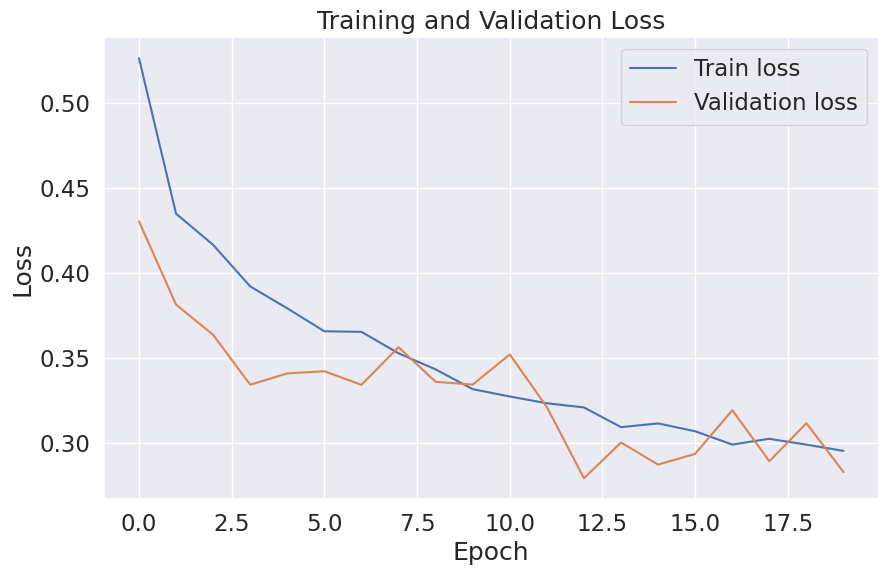

In [55]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label="Train loss")
plt.plot(history.history['val_loss'], label="Validation loss")
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.show()


training accuracy

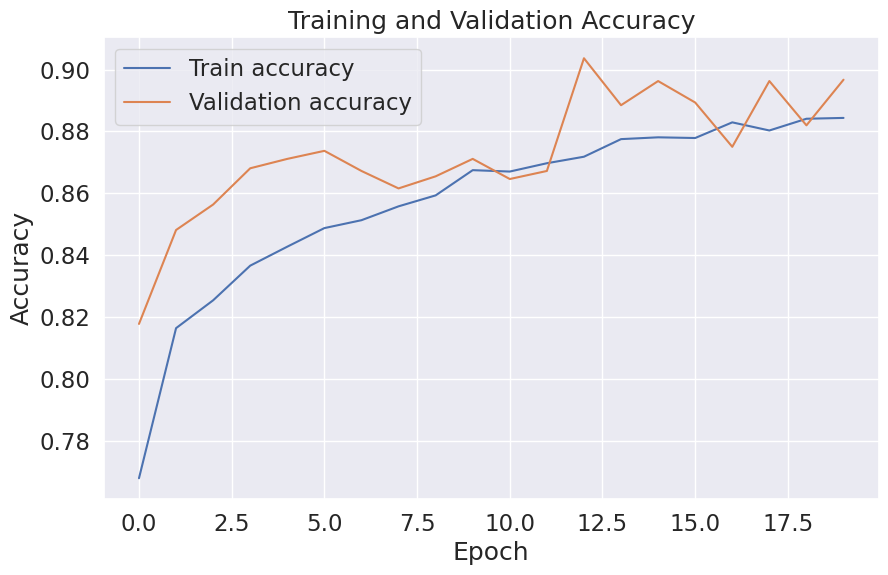

In [60]:
import matplotlib.pyplot as plt

plt.figure(figsize=[10, 6])
plt.plot(history.history["accuracy"], label="Train accuracy")
plt.plot(history.history["val_accuracy"], label="Validation accuracy")
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.show()


In [61]:
def predict_func(img):
    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.tight_layout()

    img = cv2.resize(img, (224, 224))
    img = np.reshape(img, [-1, 224, 224, 3])
    result = np.argmax(model2.predict(img))

    if result == 0:
        print("\033[94m" + "This image -> Recyclable" + "\033[0m")
    elif result == 1:
        print("\033[94m" + "This image -> Organic" + "\033[0m")


1/1 [==============================] - 0s 385ms/step
This image -> Recyclable


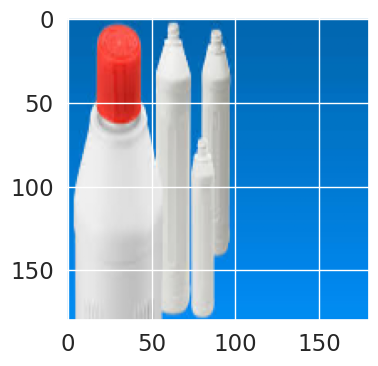

In [64]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def predict_func(img_path):
    img = cv2.imread(img_path)
    img = cv2.resize(img, (180, 180))  # Resize the image
    img = img / 255.0  # Normalize the image
    img = np.expand_dims(img, axis=0)  # Add batch dimension

    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(img.squeeze().astype(np.float32), cv2.COLOR_BGR2RGB))
    plt.tight_layout()

    result = np.argmax(model2.predict(img))

    if result == 0:
        print("\033[94m" + "This image -> Recyclable" + "\033[0m")
    elif result == 1:
        print("\033[94m" + "This image -> Organic" + "\033[0m")

# Test the function with the provided image paths
predict_func("/content/R_1111.jpg")


1/1 [==============================] - 0s 25ms/step
This image -> Recyclable


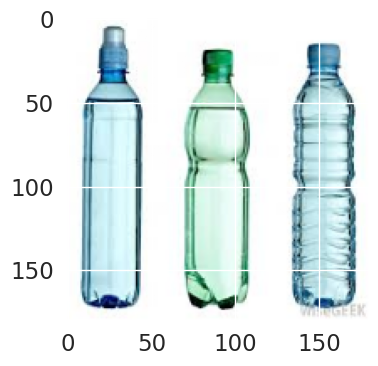

In [65]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def predict_func(img_path):
    img = cv2.imread(img_path)
    img = cv2.resize(img, (180, 180))  # Resize the image
    img = img / 255.0  # Normalize the image
    img = np.expand_dims(img, axis=0)  # Add batch dimension

    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(img.squeeze().astype(np.float32), cv2.COLOR_BGR2RGB))
    plt.tight_layout()

    result = np.argmax(model2.predict(img))

    if result == 0:
        print("\033[94m" + "This image -> Recyclable" + "\033[0m")
    elif result == 1:
        print("\033[94m" + "This image -> Organic" + "\033[0m")

# Test the function with the provided image paths
predict_func("/content/R_1005 (1).jpg")


1/1 [==============================] - 0s 41ms/step
This image -> Recyclable


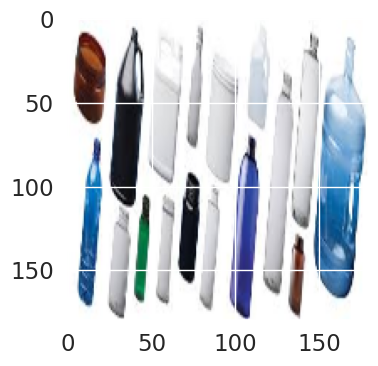

In [66]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def predict_func(img_path):
    img = cv2.imread(img_path)
    img = cv2.resize(img, (180, 180))  # Resize the image
    img = img / 255.0  # Normalize the image
    img = np.expand_dims(img, axis=0)  # Add batch dimension

    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(img.squeeze().astype(np.float32), cv2.COLOR_BGR2RGB))
    plt.tight_layout()

    result = np.argmax(model2.predict(img))

    if result == 0:
        print("\033[94m" + "This image -> Recyclable" + "\033[0m")
    elif result == 1:
        print("\033[94m" + "This image -> Organic" + "\033[0m")

# Test the function with the provided image paths
predict_func("/content/R_1015 (1).jpg")

In [67]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to evaluate the model on the test set
def evaluate_model(model, test_generator):
    # Evaluate the model on the test set
    loss, accuracy = model.evaluate(test_generator)
    print("Test Loss:", loss)
    print("Test Accuracy:", accuracy)

# Function to visualize misclassified images
# Function to visualize misclassified images
def visualize_misclassified_images(model, test_generator, num_images=10):
    misclassified_images = []
    misclassified_labels = []

    # Predict labels for images in the test set
    predictions = model.predict(test_generator)
    predicted_labels = np.argmax(predictions, axis=1)

    # Get true labels from the test generator
    true_labels = test_generator.classes

    # Collect misclassified images and their labels
    idx = 0
    for image_batch, label_batch in test_generator:
        for i in range(len(label_batch)):
            if predicted_labels[idx] != true_labels[idx]:
                misclassified_images.append(image_batch[i])  # Get image from generator
                misclassified_labels.append(predicted_labels[idx])
            idx += 1
            if len(misclassified_images) >= num_images:
                break
        if len(misclassified_images) >= num_images:
            break

    # Visualize misclassified images
    num_plots = min(num_images, len(misclassified_images))
    plt.figure(figsize=(15, 3*num_plots))
    for i in range(num_plots):
        plt.subplot(num_plots, 1, i+1)
        plt.imshow(cv2.cvtColor(misclassified_images[i], cv2.COLOR_BGR2RGB))
        plt.title("Predicted: {}".format(misclassified_labels[i]))
        plt.axis('off')
    plt.show()


model 3

In [68]:
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

# Define SVM model
svm_model = make_pipeline(StandardScaler(), SVC(kernel='linear'))

# Flatten the output for SVM input
flatten_shape = train_generator.image_shape[0] * train_generator.image_shape[1] * train_generator.image_shape[2]

# Reshape the data for SVM input
train_data_svm = train_generator.next()[0].reshape((batch_size, flatten_shape))
test_data_svm = test_generator.next()[0].reshape((batch_size, flatten_shape))

# Rescale labels to -1 and 1
train_labels_svm = train_generator.next()[1] * 2 - 1
test_labels_svm = test_generator.next()[1] * 2 - 1

# Train the SVM model
svm_model.fit(train_data_svm, train_labels_svm)


Pipeline(steps=[('standardscaler', StandardScaler()),
                ('svc', SVC(kernel='linear'))])

In [69]:
# Predict using SVM model
svm_predictions = svm_model.predict(test_data_svm)

# Evaluate SVM model
svm_accuracy = svm_model.score(test_data_svm, test_labels_svm)
print("SVM Accuracy:", svm_accuracy)


SVM Accuracy: 0.51953125


In [ ]:
from sklearn import svm
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler

# Preprocess the data
scaler = StandardScaler()
scaled_train_data = scaler.fit_transform(train_data_svm)
scaled_test_data = scaler.transform(test_data_svm)

# Define the parameter grid for GridSearchCV
param_grid = {
    'C': [0.1, 1, 10, 100],  # Regularization parameter
    'kernel': ['linear', 'rbf', 'poly'],  # Kernel type
    'gamma': ['scale', 'auto']  # Kernel coefficient (only for 'rbf' and 'poly' kernels)
}

# Create SVM model
svm_model = svm.SVC()

# Perform grid search with cross-validation
grid_search = GridSearchCV(svm_model, param_grid, cv=5, scoring='accuracy', verbose=1)
grid_search.fit(scaled_train_data, train_labels_svm)

# Get the best model
best_svm_model = grid_search.best_estimator_

# Evaluate the best model on the test set
test_accuracy = best_svm_model.score(scaled_test_data, test_labels_svm)
print("Test Accuracy:", test_accuracy)


Fitting 5 folds for each of 24 candidates, totalling 120 fits
